In [7]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.graph_objects as go
pyo.init_notebook_mode()
import datetime
from sympy import Point, Line
from sklearn.metrics import r2_score, mean_squared_error
import sys
sys.path.insert(1, '../Scripts')
from funciones import SampleIDD, simbologia, grafico_posicion_section,graficar_sections, graficar_versus_core,graficar_versus_core_rock, graficar2, grafico_edades, grafico_posicion, simbologia_core


from scipy.spatial import ConvexHull, convex_hull_plot_2d
from scatter_hull import ScatterHull

from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from scipy.interpolate import interp1d

In [8]:
sh = ScatterHull()
all_volcanoes = sh.get_all_volcanoes()

In [9]:
all_volcanoes

['Aguilera',
 'Antillanca-Casablanca',
 'Apagado',
 'Caburga-Huelemolle',
 'Calbuco',
 'Carrán-Los Venados',
 'Cay',
 'Chaitén',
 'Corcovado',
 'Cordón Cabrera',
 'Hornopirén',
 'Huanquihue Group',
 'Hudson',
 'Huequi',
 'Lanín',
 'Lautaro',
 'Llaima',
 'Macá',
 'Melimoyu',
 'Mentolat',
 'Michinmahuida',
 'Mocho-Choshuenco',
 'Monte Burney',
 'Osorno',
 'Puyehue-Cordón Caulle',
 'Quetrupillán',
 'Reclus',
 'Sollipulli',
 'Subsidiary Vcha dome',
 'Villarrica',
 'Yanteles',
 'Yate']

In [10]:
#-------------------- Load data
Data = pd.read_excel("../Data/TephraDataBase_normalizado.xlsx")
Data = Data.replace('-',np.nan)
Data = Data.replace('not determined',np.nan)
Data = Data.replace('Not analyzed',np.nan)
Data = Data.replace('n.a.',np.nan)
Data = Data.replace('n.d.',np.nan)
Data = Data.replace('Over range',np.nan)
Data = Data.replace('bdl',np.nan)
Data = Data.replace('<1',np.nan)
Data = Data.replace('<4',np.nan)
Data = Data.replace('<6',np.nan)
Data = Data.replace('<5',np.nan)
Data = Data.replace('<10',np.nan)
Data = Data.replace('<0.01',np.nan)
Data = Data.replace('<0.1',np.nan)
Data.Flag = Data.Flag.astype(str)
Data = Data[(Data.Flag.str.contains('|'.join(['Outlier','VolcanicSource_Issue'])) == False)]
Data = Data[Data.Volcano!='Unknown']

No handles with labels found to put in legend.


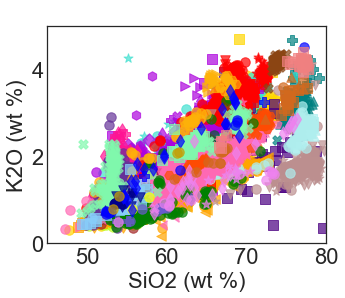

In [11]:
#Plot all data except samples for which the volcano originating the volcanic products is still unknown
graficar_versus_core('SiO2','K2O',Data[Data.Volcano!='Unknown'] ,Xmin=45,Xmax=80,Ymin=0,Ymax=5)

### 1.- Calculate and visualize 'effusive' and 'bulk pyroclastic' products linear regressions (SiO2 versus K2O)

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

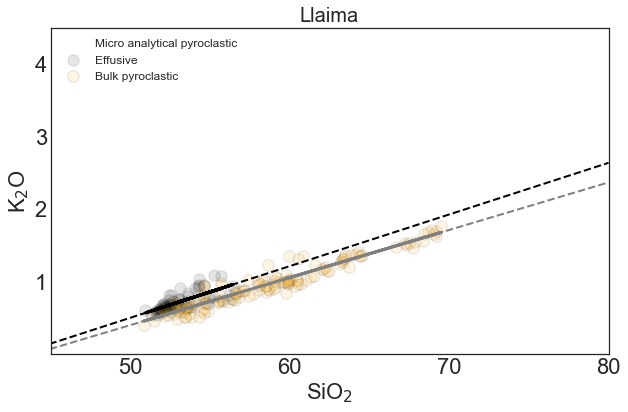

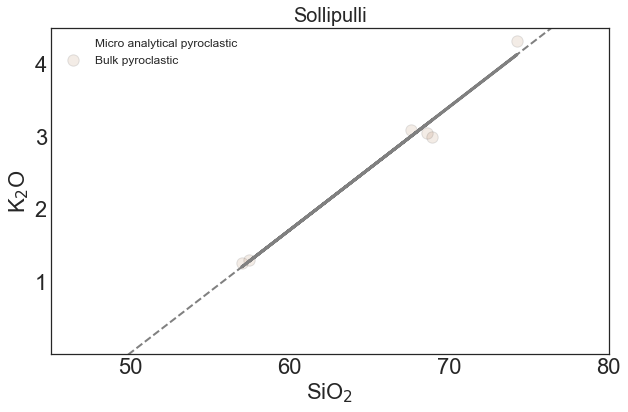

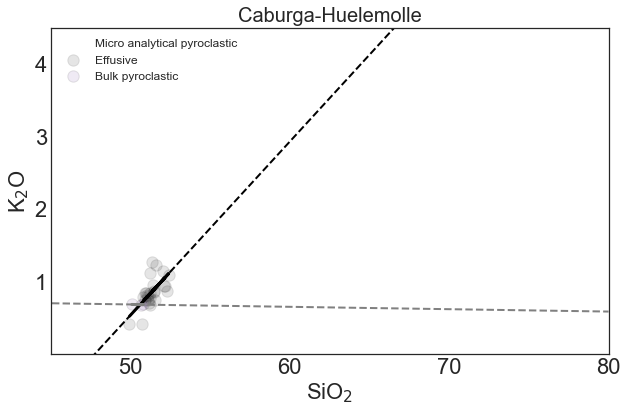

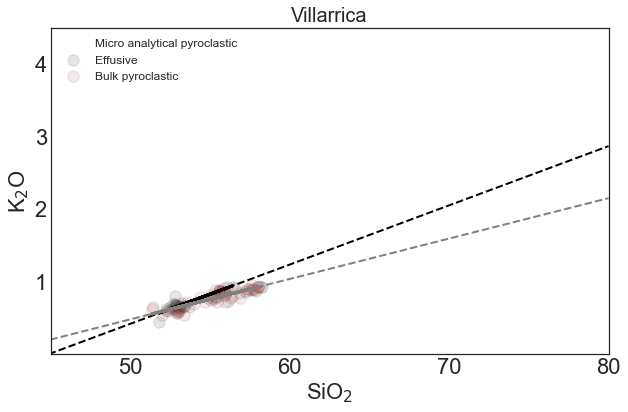

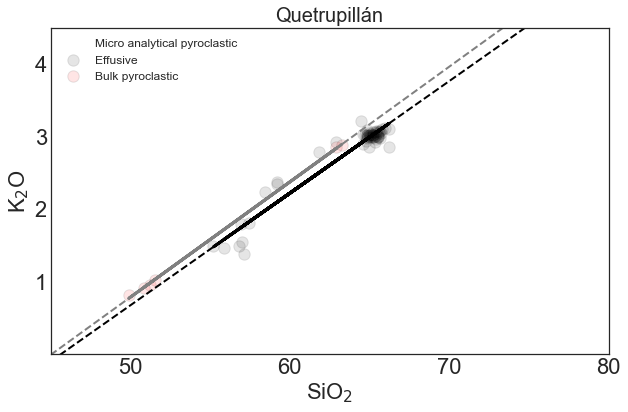

...

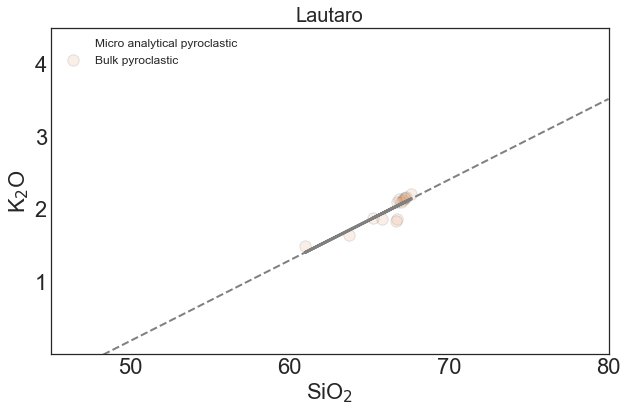

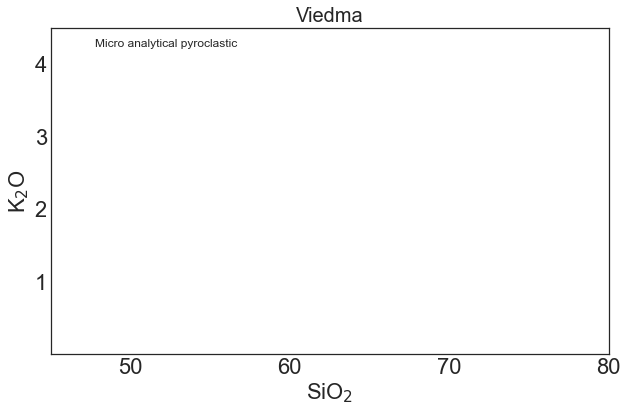

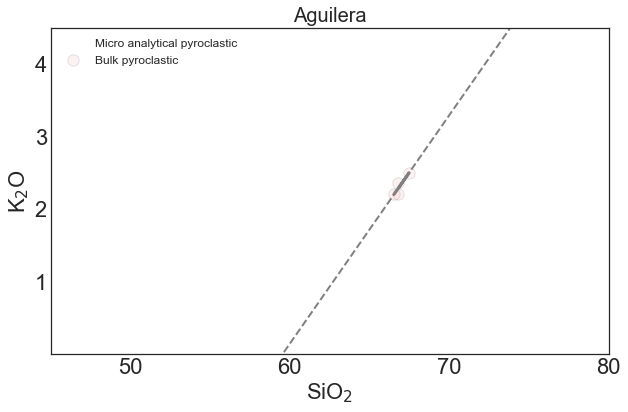

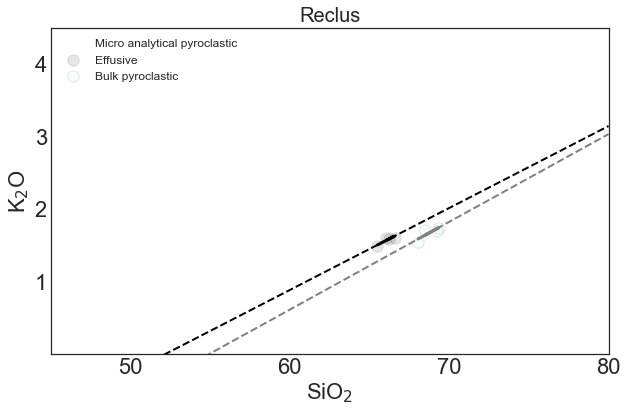

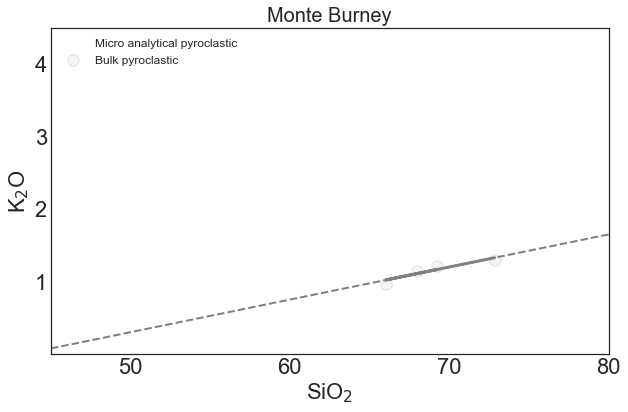

In [13]:
Data = Data.dropna(subset=['SiO2','K2O'],axis=0,how='all')
Data_glass = Data[(Data.TypeOfRegister=='Pyroclastic material')&(Data.TypeOfAnalysis=='Micro Analytical')]
Data_bulk = Data[(Data.TypeOfRegister=='Pyroclastic material')&(Data.TypeOfAnalysis=='Bulk')]
Data_effusive = Data[(Data.TypeOfRegister=='Effusive material')]

volcanoes_by_latitude = ['Llaima','Sollipulli','Caburga-Huelemolle','Villarrica','Quetrupillán','Lanín',
              'Huanquihue Group','Mocho-Choshuenco','Carrán-Los Venados','Puyehue-Cordón Caulle','Antillanca-Casablanca',
              'Osorno','Calbuco','Yate','Apagado','Hornopirén','Huequi','Michinmahuida','Chaitén','Corcovado',
              'Yanteles','Melimoyu','Mentolat','Cay','Macá','Hudson',
              'Lautaro','Viedma','Aguilera','Reclus','Monte Burney']

fit_info = pd.DataFrame()
fit_info['Volcano'] = volcanoes_by_latitude
fit_info['polinomial fit coeff a/effusive regression'] = np.nan #considering a linear regression: y = a + bx
fit_info['polinomial fit coeff b/effusive regression'] = np.nan
fit_info['number of samples for effusive regression'] = np.nan
fit_info['polinomial fit coeff a/bulk pyroclastic regression'] = np.nan
fit_info['polinomial fit coeff b/bulk pyroclastic regression'] = np.nan
fit_info['number of samples for bulk pyroclastic regression'] = np.nan
fit_info['fit case'] = np.nan


# R2 and RMSE are measures of the fit of the data to the regression
fit_info['R2_effusive_regression'] = np.nan;fit_info['RMSE_effusive_regression'] = np.nan
fit_info['R2_bulk_pyroclastic_regression'] = np.nan;fit_info['RMSE_bulk_pyroclastic_regression'] = np.nan

# In order to check if 'bulk pyroclastic' data fits the 'effusive' products regression, I calculated R2 and RMSE of
#    the 'bulk pyroclastic' products to the 'effusive' linear regression and viceversa
fit_info['R2_effusive_to_bulk_pyroclastic_regression'] = np.nan;fit_info['RMSE_effusive_to_bulk_pyroclastic_regression'] = np.nan
fit_info['R2_bulk_pyroclastic_to_effusive_regression'] = np.nan;fit_info['RMSE_bulk_pyroclastic_to_effusive_regression'] = np.nan


for volcan in volcanoes_by_latitude:
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
    Color, Marker  = simbologia(volcan,'Unknown')
    index = fit_info.index[fit_info.Volcano == volcan].tolist()[0]
    plt.scatter(Data[Data.Volcano == volcan].SiO2,Data[Data.Volcano == volcan].K2O,color=Color,edgecolors =Color,s=130,alpha=0,label='Micro analytical pyroclastic')
    
    #----------- 'effusive' products 
    if len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)>2:
        z, rmse, rank, singular_values, rcond = np.polyfit(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,1,full=True)
        p = np.poly1d(z)
        r2 = r2_score(Data_effusive[Data_effusive.Volcano == volcan].K2O, p(Data_effusive[Data_effusive.Volcano == volcan].SiO2))
                
        #---------------- plot 'effusive' data and regression
        plt.scatter(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,color='black',edgecolors ='black',s=130,alpha=0.1,label='Effusive')
        plt.plot(Data_effusive[Data_effusive.Volcano == volcan].SiO2,p(Data_effusive[Data_effusive.Volcano == volcan].SiO2),color='black',linewidth=3)
        plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=2)
        #print ("y=%.6fx+(%.6f)"%(z[0],z[1])) 
            
#         ax.text(82,4.2,"Effusive: y = {}x + {}".format(np.around(z[0],3),np.around(z[1],3)),rotation=0,color='black',fontsize=14)
#         ax.text(82,3.7,"$r^{2}$ = "+str(np.around(r2,3)),rotation=0,color='black',fontsize=14)
#         ax.text(82,3.2,"RMSE = "+str(np.around(rmse[0],3)),rotation=0,color='black',fontsize=14)    
     
        #---------------- save 'effusive' regression's R2 and RMSE
        fit_info.loc[index,'R2_effusive_regression'] = r2
        fit_info.loc[index,'RMSE_effusive_regression'] = rmse
        fit_info.loc[index,'polinomial fit coeff a/effusive regression'] = np.around(z[1],3)
        fit_info.loc[index,'polinomial fit coeff b/effusive regression'] = np.around(z[0],3)
        fit_info.loc[index,'number of samples for effusive regression'] = len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)

    #----------- 'bulk pyroclastic' products    
    if len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)>2:
        z_bulk, rmse_bulk, rank_bulk, singular_values_bulk, rcond_bulk  = np.polyfit(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,1,full=True)
        p_bulk = np.poly1d(z_bulk)
        r2_bulk = r2_score(Data_bulk[Data_bulk.Volcano == volcan].K2O, p_bulk(Data_bulk[Data_bulk.Volcano == volcan].SiO2))

        #---------------- plot 'bulk pyroclastic' data and regression
        plt.scatter(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,color=Color,edgecolors ='black',s=130,alpha=0.1,label='Bulk pyroclastic')
        plt.plot(Data_bulk[Data_bulk.Volcano == volcan].SiO2,p_bulk(Data_bulk[Data_bulk.Volcano == volcan].SiO2),color='grey',linewidth=3)
        plt.plot(np.array([40,80]),p_bulk(np.array([40,80])),color='grey',linestyle='--',linewidth=2)
        #print ("y=%.6fx+(%.6f)"%(z[0],z[1])) 
            
#         ax.text(82,2.3,"Bulk pyroclastic: y = {}x + {}".format(np.around(z_bulk[0],3),np.around(z_bulk[1],3)),rotation=0,color='black',fontsize=14)
#         ax.text(82,1.8,"$r^{2}$ = "+str(np.around(r2_bulk,3)),rotation=0,color='black',fontsize=14)
#         ax.text(82,1.3,"RMSE = "+str(np.around(rmse_bulk[0],3)),rotation=0,color='black',fontsize=14)

        #---------------- save 'bulk pyroclastic' regression's R2 and RMSE
        fit_info.loc[index,'R2_bulk_pyroclastic_regression'] = r2_bulk
        fit_info.loc[index,'RMSE_bulk_pyroclastic_regression'] = rmse_bulk
        fit_info.loc[index,'polinomial fit coeff a/bulk pyroclastic regression'] = np.around(z[1],3)
        fit_info.loc[index,'polinomial fit coeff b/bulk pyroclastic regression'] = np.around(z[0],3)
        fit_info.loc[index,'number of samples for bulk pyroclastic regression'] = len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)
        
    if (len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)>2) & (len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)>2):
        #--------------------------- 'bulk pyroclastic' data fit to 'effusive' regression
        r2 = r2_score(Data_bulk[Data_bulk.Volcano == volcan].K2O, p(Data_bulk[Data_bulk.Volcano == volcan].SiO2))
        rmse = np.sqrt(mean_squared_error(Data_bulk[Data_bulk.Volcano == volcan].K2O, p(Data_bulk[Data_bulk.Volcano == volcan].SiO2)))
#         ax.text(82,.3,"Pyroclastic fit to effusive regression: R2 = "+str(np.around(r2,3))+" RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14)
        fit_info.loc[index,'R2_bulk_pyroclastic_to_effusive_regression'] = r2
        fit_info.loc[index,'RMSE_bulk_pyroclastic_to_effusive_regression'] = rmse       
        
        #--------------------------- 'effusive' data fit to 'bulk pyroclastic' regression 
        r2 = r2_score(Data_effusive[Data_effusive.Volcano == volcan].K2O, p_bulk(Data_effusive[Data_effusive.Volcano == volcan].SiO2))
        rmse = np.sqrt(mean_squared_error(Data_effusive[Data_effusive.Volcano == volcan].K2O, p_bulk(Data_effusive[Data_effusive.Volcano == volcan].SiO2)))
#         ax.text(82,.6,"Effusive fit to pyroclastic regression: R2 = "+str(np.around(r2,3))+" RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14)
        fit_info.loc[index,'R2_effusive_to_bulk_pyroclastic_regression'] = r2
        fit_info.loc[index,'RMSE_effusive_to_bulk_pyroclastic_regression'] = rmse
    
    leg=plt.legend(fancybox=True,ncol=1,loc='upper left',fontsize=12)
    ax.set_xticks([50,60,70,80])
    ax.set_yticks([1,2,3,4])    
    plt.title(volcan, fontsize = 20)
    plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22)
    plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
    ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
    plt.xlim(45,80)
    plt.ylim(0,4.5)
#     plt.savefig('../Plots/'+volcan+'_trend.png',dpi = 300,bbox_inches='tight', transparent='True')

In [ ]:
# Data = Data.dropna(subset=['SiO2','K2O'],axis=0,how='all')
# Data_glass = Data[(Data.TypeOfRegister=='Pyroclastic material')&(Data.TypeOfAnalysis=='Micro Analytical')]
# Data_bulk = Data[(Data.TypeOfRegister=='Pyroclastic material')&(Data.TypeOfAnalysis=='Bulk')]
# Data_effusive = Data[(Data.TypeOfRegister=='Effusive material')]

# volcanoes_by_latitude = ['Llaima','Sollipulli','Caburga-Huelemolle','Villarrica','Quetrupillán','Lanín',
#               'Huanquihue Group','Mocho-Choshuenco','Carrán-Los Venados','Puyehue-Cordón Caulle','Antillanca-Casablanca',
#               'Osorno','Calbuco','Yate','Apagado','Hornopirén','Huequi','Michinmahuida','Chaitén','Corcovado',
#               'Yanteles','Melimoyu','Mentolat','Cay','Macá','Hudson',
#               'Lautaro','Viedma','Aguilera','Reclus','Monte Burney']

# fit_info = pd.DataFrame()
# fit_info['Volcano'] = volcanoes_by_latitude
# fit_info['polinomial fit coeff a/effusive regression'] = np.nan #considering a linear regression: y = a + bx
# fit_info['polinomial fit coeff b/effusive regression'] = np.nan
# fit_info['number of samples for effusive regression'] = np.nan
# fit_info['polinomial fit coeff a/bulk pyroclastic regression'] = np.nan
# fit_info['polinomial fit coeff b/bulk pyroclastic regression'] = np.nan
# fit_info['number of samples for bulk pyroclastic regression'] = np.nan
# fit_info['fit case'] = np.nan


# # R2 and RMSE are measures of the fit of the data to the regression
# fit_info['R2_effusive_regression'] = np.nan;fit_info['RMSE_effusive_regression'] = np.nan
# fit_info['R2_bulk_pyroclastic_regression'] = np.nan;fit_info['RMSE_bulk_pyroclastic_regression'] = np.nan

# # In order to check if 'bulk pyroclastic' data fits the 'effusive' products regression, I calculated R2 and RMSE of
# #    the 'bulk pyroclastic' products to the 'effusive' linear regression and viceversa
# fit_info['R2_effusive_to_bulk_pyroclastic_regression'] = np.nan;fit_info['RMSE_effusive_to_bulk_pyroclastic_regression'] = np.nan
# fit_info['R2_bulk_pyroclastic_to_effusive_regression'] = np.nan;fit_info['RMSE_bulk_pyroclastic_to_effusive_regression'] = np.nan


# for volcan in volcanoes_by_latitude:
# #     plt.figure(figsize=(5,4))
# #     ax = plt.axes()
#     fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
#     Color, Marker  = simbologia(volcan,'Unknown')
#     index = fit_info.index[fit_info.Volcano == volcan].tolist()[0]
#     plt.scatter(Data_glass[Data_glass.Volcano == volcan].SiO2,Data_glass[Data_glass.Volcano == volcan].K2O,color=Color,edgecolors =Color,s=130,alpha=0,label='Micro analytical pyroclastic')
#     # DBSCAN
#     v_samples = Data_glass[Data_glass.Volcano == volcan]
#     points = []
#     x_dim = 'SiO2'
#     y_dim = 'K2O'
#     for i, row in v_samples.iterrows():
#         if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
#         vp = [row[x_dim], row[y_dim]]
#         points.append(vp)
#     points = np.array(points)

#     clusters = sh.get_clusters_dbscan(points, eps=1, algorithm='auto')
#     for c_label, c_points in clusters.items():
#         if len(c_points) > 2:
#             hull = ConvexHull(c_points)
# #                 for simplex in hull.simplices:
# #                     axes.plot(c_points[simplex, 0], c_points[simplex, 1], 'k-')
#             vertexs = []
#             for simplex in hull.vertices:
#                 vertexs.append([c_points[simplex, 0], c_points[simplex, 1]])
#             patches = []
#             polygon = Polygon(vertexs, True)
#             patches.append(polygon)
#             patchColl = PatchCollection(patches, alpha=0.4)
#             patchColl.set_color('black')
#             ax.add_collection(patchColl)
    
#     #----------- 'effusive' products 
#     if len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)>2:
#         z, rmse, rank, singular_values, rcond = np.polyfit(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,1,full=True)
#         p = np.poly1d(z)
#         r2 = r2_score(Data_effusive[Data_effusive.Volcano == volcan].K2O, p(Data_effusive[Data_effusive.Volcano == volcan].SiO2))
                
#         #---------------- plot 'effusive' data and regression
#         plt.scatter(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,color='black',edgecolors ='black',s=130,alpha=0.1,label='Effusive')
#         plt.plot(Data_effusive[Data_effusive.Volcano == volcan].SiO2,p(Data_effusive[Data_effusive.Volcano == volcan].SiO2),color='black',linewidth=3)
#         plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=2)
#         #print ("y=%.6fx+(%.6f)"%(z[0],z[1])) 
        
#         # DBSCAN
#         v_samples = Data_effusive[Data_effusive.Volcano == volcan]
#         points = []
#         x_dim = 'SiO2'
#         y_dim = 'K2O'
#         for i, row in v_samples.iterrows():
#             if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
#             vp = [row[x_dim], row[y_dim]]
#             points.append(vp)
#         points = np.array(points)
        
#         clusters = sh.get_clusters_dbscan(points, eps=1, algorithm='auto')
#         for c_label, c_points in clusters.items():
#             if len(c_points) > 2:
#                 hull = ConvexHull(c_points)
# #                 for simplex in hull.simplices:
# #                     axes.plot(c_points[simplex, 0], c_points[simplex, 1], 'k-')
#                 vertexs = []
#                 for simplex in hull.vertices:
#                     vertexs.append([c_points[simplex, 0], c_points[simplex, 1]])
#                 patches = []
#                 polygon = Polygon(vertexs, True)
#                 patches.append(polygon)
#                 patchColl = PatchCollection(patches, alpha=0.4)
#                 patchColl.set_color('black')
#                 ax.add_collection(patchColl)
            
# #         ax.text(82,4.2,"Effusive: y = {}x + {}".format(np.around(z[0],3),np.around(z[1],3)),rotation=0,color='black',fontsize=14)
# #         ax.text(82,3.7,"$r^{2}$ = "+str(np.around(r2,3)),rotation=0,color='black',fontsize=14)
# #         ax.text(82,3.2,"RMSE = "+str(np.around(rmse[0],3)),rotation=0,color='black',fontsize=14)    
     
#         #---------------- save 'effusive' regression's R2 and RMSE
#         fit_info.loc[index,'R2_effusive_regression'] = r2
#         fit_info.loc[index,'RMSE_effusive_regression'] = rmse
#         fit_info.loc[index,'polinomial fit coeff a/effusive regression'] = np.around(z[1],3)
#         fit_info.loc[index,'polinomial fit coeff b/effusive regression'] = np.around(z[0],3)
#         fit_info.loc[index,'number of samples for effusive regression'] = len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)

#     #----------- 'bulk pyroclastic' products    
#     if len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)>2:
#         z_bulk, rmse_bulk, rank_bulk, singular_values_bulk, rcond_bulk  = np.polyfit(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,1,full=True)
#         p_bulk = np.poly1d(z_bulk)
#         r2_bulk = r2_score(Data_bulk[Data_bulk.Volcano == volcan].K2O, p_bulk(Data_bulk[Data_bulk.Volcano == volcan].SiO2))

#         #---------------- plot 'bulk pyroclastic' data and regression
#         plt.scatter(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,color=Color,edgecolors ='black',s=130,alpha=0.1,label='Bulk pyroclastic')
#         plt.plot(Data_bulk[Data_bulk.Volcano == volcan].SiO2,p_bulk(Data_bulk[Data_bulk.Volcano == volcan].SiO2),color='grey',linewidth=3)
#         plt.plot(np.array([40,80]),p_bulk(np.array([40,80])),color='grey',linestyle='--',linewidth=2)
#         #print ("y=%.6fx+(%.6f)"%(z[0],z[1])) 
        
#         # DBSCAN
#         v_samples = Data_bulk[Data_bulk.Volcano == volcan]
#         points = []
#         x_dim = 'SiO2'
#         y_dim = 'K2O'
#         for i, row in v_samples.iterrows():
#             if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
#             vp = [row[x_dim], row[y_dim]]
#             points.append(vp)
#         points = np.array(points)
        
#         clusters = sh.get_clusters_dbscan(points, eps=1, algorithm='auto')
#         for c_label, c_points in clusters.items():
#             if len(c_points) > 2:
#                 hull = ConvexHull(c_points)
# #                 for simplex in hull.simplices:
# #                     axes.plot(c_points[simplex, 0], c_points[simplex, 1], 'k-')
#                 vertexs = []
#                 for simplex in hull.vertices:
#                     vertexs.append([c_points[simplex, 0], c_points[simplex, 1]])
#                 patches = []
#                 polygon = Polygon(vertexs, True)
#                 patches.append(polygon)
#                 patchColl = PatchCollection(patches, alpha=0.4)
#                 patchColl.set_color(Color)
#                 ax.add_collection(patchColl)
            
# #         ax.text(82,2.3,"Bulk pyroclastic: y = {}x + {}".format(np.around(z_bulk[0],3),np.around(z_bulk[1],3)),rotation=0,color='black',fontsize=14)
# #         ax.text(82,1.8,"$r^{2}$ = "+str(np.around(r2_bulk,3)),rotation=0,color='black',fontsize=14)
# #         ax.text(82,1.3,"RMSE = "+str(np.around(rmse_bulk[0],3)),rotation=0,color='black',fontsize=14)

#         #---------------- save 'bulk pyroclastic' regression's R2 and RMSE
#         fit_info.loc[index,'R2_bulk_pyroclastic_regression'] = r2_bulk
#         fit_info.loc[index,'RMSE_bulk_pyroclastic_regression'] = rmse_bulk
#         fit_info.loc[index,'polinomial fit coeff a/bulk pyroclastic regression'] = np.around(z[1],3)
#         fit_info.loc[index,'polinomial fit coeff b/bulk pyroclastic regression'] = np.around(z[0],3)
#         fit_info.loc[index,'number of samples for bulk pyroclastic regression'] = len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)
        
#     if (len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)>2) & (len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)>2):
#         #--------------------------- 'bulk pyroclastic' data fit to 'effusive' regression
#         r2 = r2_score(Data_bulk[Data_bulk.Volcano == volcan].K2O, p(Data_bulk[Data_bulk.Volcano == volcan].SiO2))
#         rmse = np.sqrt(mean_squared_error(Data_bulk[Data_bulk.Volcano == volcan].K2O, p(Data_bulk[Data_bulk.Volcano == volcan].SiO2)))
# #         ax.text(82,.3,"Pyroclastic fit to effusive regression: R2 = "+str(np.around(r2,3))+" RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14)
#         fit_info.loc[index,'R2_bulk_pyroclastic_to_effusive_regression'] = r2
#         fit_info.loc[index,'RMSE_bulk_pyroclastic_to_effusive_regression'] = rmse       
        
#         #--------------------------- 'effusive' data fit to 'bulk pyroclastic' regression 
#         r2 = r2_score(Data_effusive[Data_effusive.Volcano == volcan].K2O, p_bulk(Data_effusive[Data_effusive.Volcano == volcan].SiO2))
#         rmse = np.sqrt(mean_squared_error(Data_effusive[Data_effusive.Volcano == volcan].K2O, p_bulk(Data_effusive[Data_effusive.Volcano == volcan].SiO2)))
# #         ax.text(82,.6,"Effusive fit to pyroclastic regression: R2 = "+str(np.around(r2,3))+" RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14)
#         fit_info.loc[index,'R2_effusive_to_bulk_pyroclastic_regression'] = r2
#         fit_info.loc[index,'RMSE_effusive_to_bulk_pyroclastic_regression'] = rmse
    
#     leg=plt.legend(fancybox=True,ncol=1,loc='upper left',fontsize=12)
#     ax.set_xticks([50,60,70,80])
#     ax.set_yticks([1,2,3,4])    
#     plt.title(volcan, fontsize = 20)
#     plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22)
#     plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
#     ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
#     plt.xlim(45,80)
#     plt.ylim(0,4.5)
#     plt.savefig('../Plots/'+volcan+'_trend.png',dpi = 300,bbox_inches='tight', transparent='True')

In [14]:
fit_info

,Volcano,polinomial fit coeff a/effusive regression,polinomial fit coeff b/effusive regression,number of samples for effusive regression,polinomial fit coeff a/bulk pyroclastic regression,polinomial fit coeff b/bulk pyroclastic regression,number of samples for bulk pyroclastic regression,fit case,R2_effusive_regression,RMSE_effusive_regression,R2_bulk_pyroclastic_regression,RMSE_bulk_pyroclastic_regression,R2_effusive_to_bulk_pyroclastic_regression,RMSE_effusive_to_bulk_pyroclastic_regression,R2_bulk_pyroclastic_to_effusive_regression,RMSE_bulk_pyroclastic_to_effusive_regression
0,Llaima,-3.069,0.071,63.0,-3.069,0.071,137.0,NaN,0.528294,0.515120,0.925180,1.072397,-0.286909,0.149356,0.703003,0.176273
1,Sollipulli,NaN,NaN,NaN,-3.069,0.071,6.0,NaN,NaN,NaN,0.983495,0.116088,NaN,NaN,NaN,NaN
2,Caburga-Huelemolle,-11.452,0.240,25.0,-11.452,0.240,3.0,NaN,0.411723,0.613415,0.091208,0.000033,-0.767707,0.271532,-533.039535,0.080152
3,Villarrica,-3.675,0.082,20.0,-3.675,0.082,60.0,NaN,0.773000,0.058499,0.806907,0.160161,0.648959,0.067255,0.190124,0.105811
4,Quetrupillán,-7.067,0.155,55.0,-7.067,0.155,6.0,NaN,0.930734,0.953471,0.999351,0.003292,0.812614,0.216562,0.977520,0.137806
5,Lanín,-6.265,0.142,34.0,-6.265,0.142,3.0,NaN,0.871612,1.895911,0.788769,0.008535,0.589312,0.422342,-0.617249,0.147587
6,Huanquihue Group,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Mocho-Choshuenco,NaN,NaN,NaN,-6.265,0.142,121.0,NaN,NaN,NaN,0.857260,2.903823,NaN,NaN,NaN,NaN
8,Carrán-Los Venados,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Puyehue-Cordón Caulle,-5.231,0.114,55.0,-5.231,0.114,35.0,NaN,0.981687,0.730957,0.975565,0.146977,0.973206,0.139445,0.966527,0.075846


### 2.- Filter volcanoes by fit of data to regressions
I considered a good fit of data to the regression when R2 > 0.56 and RMSE < 0.3. Each user might consider different thresholds. 

In [15]:
r2_threshold = 0.56
RMSE_threshold = 1.1
fit_info = fit_info.replace(np.nan,-1)

In [16]:
print('\033[1m'+ 'Case 0: Volcanoes whith not enough data for the regressions' + '\033[0m')
Volcanoes_no_fit = fit_info[(fit_info.R2_effusive_regression == -1)
                            & (fit_info.R2_bulk_pyroclastic_regression == -1)].Volcano
index = fit_info[fit_info.Volcano.isin(Volcanoes_no_fit.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 0'
print(Volcanoes_no_fit.tolist())
print(" ")

print('\033[1m'+ 'Volcanoes with both "effusive" and "bulk pyroclastic" data' + '\033[0m')
print('\033[1m'+ '    Case 1: Volcanoes where "effusive" data fit "bulk pyroclastic" regression, and viceversa' + '\033[0m')
Volcanoes_both_fit = fit_info[
     ((fit_info.R2_effusive_regression > r2_threshold) & (fit_info.RMSE_effusive_regression < RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_regression > r2_threshold)&(fit_info.RMSE_bulk_pyroclastic_regression < RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_to_effusive_regression > r2_threshold) & (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression < RMSE_threshold))
    &((fit_info.R2_effusive_to_bulk_pyroclastic_regression > r2_threshold) & (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression < RMSE_threshold))].Volcano
print(Volcanoes_both_fit.tolist())
Data_volcanoes_both_fit = Data[Data.Volcano.isin(Volcanoes_both_fit.tolist())]
index = fit_info[fit_info.Volcano.isin(Volcanoes_both_fit.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 1'
print(" ")

print('\033[1m'+ '    Case 2: Volcanoes where only "effusive" data fit "bulk pyroclastic" regression' + '\033[0m')
Volcanoes_effusive_fit_pyro = fit_info[
    ((fit_info.R2_bulk_pyroclastic_regression > r2_threshold) & (fit_info.RMSE_bulk_pyroclastic_regression < RMSE_threshold))
    &((fit_info.R2_effusive_to_bulk_pyroclastic_regression > r2_threshold) & (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression < RMSE_threshold))
    &(((fit_info.R2_bulk_pyroclastic_to_effusive_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression > RMSE_threshold))
    |((fit_info.R2_effusive_to_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression > RMSE_threshold)))].Volcano

print(Volcanoes_effusive_fit_pyro.tolist())
Data_volcanoes_effusive_fit_pyro = Data[Data.Volcano.isin(Volcanoes_effusive_fit_pyro.tolist())]
index = fit_info[fit_info.Volcano.isin(Volcanoes_effusive_fit_pyro)].index.values
fit_info.loc[index,'fit case'] =  'Case 2'
print(" ")

print('\033[1m'+ '    Case 3: Volcanoes where only "bulk pyroclastic" data fit "effusive" regression' + '\033[0m')
Volcanoes_pyro_fit_effusive = fit_info[
    ((fit_info.R2_effusive_regression > r2_threshold) & (fit_info.RMSE_effusive_regression < RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_to_effusive_regression > r2_threshold) & (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression < RMSE_threshold))
    &(((fit_info.R2_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_regression > RMSE_threshold))
    |((fit_info.R2_effusive_to_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression > RMSE_threshold)))].Volcano

print(Volcanoes_pyro_fit_effusive.tolist())
Data_volcanoes_pyro_fit_effusive = Data[Data.Volcano.isin(Volcanoes_pyro_fit_effusive.tolist())]
index = fit_info[fit_info.Volcano.isin(Volcanoes_pyro_fit_effusive.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 3'
print(" ")

print('\033[1m'+ '    Case 6: Volcanoes where only "effusive" ("pyroclastic") data fits "effusive" ("pyroclastic") regression' + '\033[0m')
VolcanoesX = fit_info[
     ((fit_info.R2_effusive_regression != -1)&(fit_info.R2_bulk_pyroclastic_regression != -1))
    &(((fit_info.R2_effusive_regression > r2_threshold) & (fit_info.RMSE_effusive_regression < RMSE_threshold))
    |((fit_info.R2_bulk_pyroclastic_regression > r2_threshold)&(fit_info.RMSE_bulk_pyroclastic_regression < RMSE_threshold)))
    &(((fit_info.R2_bulk_pyroclastic_to_effusive_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression > RMSE_threshold))
    &((fit_info.R2_effusive_to_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression > RMSE_threshold)))].Volcano
index = fit_info[fit_info.Volcano.isin(VolcanoesX.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 6'
print(VolcanoesX.tolist())
print(" ")

print('\033[1m'+ '    Case 7: Volcanoes where "effusive" data fits "bulk pyroclastic" regression but "bulk pyroclastic" regression doesnt meet the criteria or viceversa' + '\033[0m')
VolcanoesY = fit_info[
     ((fit_info.R2_effusive_regression != -1)&(fit_info.R2_bulk_pyroclastic_regression != -1))
    &((((fit_info.R2_effusive_regression < r2_threshold) | (fit_info.RMSE_effusive_regression > RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_regression > r2_threshold) & (fit_info.RMSE_bulk_pyroclastic_regression < RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_to_effusive_regression > r2_threshold) & (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression < RMSE_threshold))
    &((fit_info.R2_effusive_to_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression > RMSE_threshold))))
    
    |((((fit_info.R2_effusive_regression > r2_threshold) & (fit_info.RMSE_effusive_regression < RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_regression > RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_to_effusive_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression > RMSE_threshold))
    &((fit_info.R2_effusive_to_bulk_pyroclastic_regression > r2_threshold) & (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression < RMSE_threshold))))].Volcano
print(VolcanoesY.tolist())
index = fit_info[fit_info.Volcano.isin(VolcanoesY.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 7'
print(" ")

print('\033[1m'+ '    Case 8.1: Volcanoes where nothing fits' + '\033[0m')
VolcanoesZ = fit_info[
     ((fit_info.R2_effusive_regression != -1)&(fit_info.R2_bulk_pyroclastic_regression != -1))
    &(((fit_info.R2_effusive_regression < r2_threshold) | (fit_info.RMSE_effusive_regression > RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_regression > RMSE_threshold))
    &((fit_info.R2_bulk_pyroclastic_to_effusive_regression < r2_threshold) | (fit_info.RMSE_bulk_pyroclastic_to_effusive_regression > RMSE_threshold))
    &((fit_info.R2_effusive_to_bulk_pyroclastic_regression < r2_threshold) | (fit_info.RMSE_effusive_to_bulk_pyroclastic_regression > RMSE_threshold)))].Volcano
print(VolcanoesZ.tolist())
index = fit_info[fit_info.Volcano.isin(VolcanoesZ.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 8.1'
print(" ")


print('\033[1m'+ 'Volcanoes with only "effusive" data or "bulk pyroclastic" data' + '\033[0m')
print('\033[1m'+ '    Case 4: Volcanoes where only "effusive" data fit well the regression' + '\033[0m')
Volcanoes_good_effusive_fit = fit_info[
    ((fit_info.R2_effusive_regression > r2_threshold) & (fit_info.RMSE_effusive_regression < RMSE_threshold))
    & ((fit_info.R2_bulk_pyroclastic_regression == -1))].Volcano

print(Volcanoes_good_effusive_fit.tolist())
Data_volcanoes_good_effusive_fit = Data[Data.Volcano.isin(Volcanoes_good_effusive_fit.tolist())]
index = fit_info[fit_info.Volcano.isin(Volcanoes_good_effusive_fit.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 4'
print(" ")

print('\033[1m'+ '    Case 5: Volcanoes where only "bulk pyroclastic" data fit well the regression' + '\033[0m')
Volcanoes_good_bulk_pyro_fit = fit_info[
    (fit_info.R2_effusive_regression == -1)
    & ((fit_info.R2_bulk_pyroclastic_regression > r2_threshold)&(fit_info.RMSE_bulk_pyroclastic_regression < RMSE_threshold))].Volcano

print(Volcanoes_good_bulk_pyro_fit.tolist())
Data_volcanoes_good_bulk_pyro_fit = Data[Data.Volcano.isin(Volcanoes_good_bulk_pyro_fit.tolist())]
index = fit_info[fit_info.Volcano.isin(Volcanoes_good_bulk_pyro_fit.tolist())].index.values
fit_info.loc[index,'fit case'] = 'Case 5'
print(" ")

print('\033[1m'+ '    Case 8.2: Volcanoes where neither "effusive" nor "bulk pyroclastic" products fit well their respective regressions' + '\033[0m')
Volcanoes_bad_effusive_bulk_pyro_fit = fit_info[
    ((fit_info.R2_effusive_regression == -1)
  & ((fit_info.R2_bulk_pyroclastic_regression < r2_threshold)|(fit_info.RMSE_bulk_pyroclastic_regression > RMSE_threshold)))
  | ((fit_info.R2_effusive_regression < r2_threshold) | (fit_info.RMSE_effusive_regression > RMSE_threshold))
  & ((fit_info.R2_bulk_pyroclastic_regression == -1))].Volcano
print([item for item in Volcanoes_bad_effusive_bulk_pyro_fit.tolist() if item not in (Volcanoes_no_fit.tolist())])
index = fit_info[fit_info.Volcano.isin([item for item in Volcanoes_bad_effusive_bulk_pyro_fit.tolist() if item not in (Volcanoes_no_fit.tolist())])].index.values
fit_info.loc[index,'fit case'] = 'Case 8.2'
print(" ")

Case 0: Volcanoes whith not enough data for the regressions
['Huanquihue Group', 'Carrán-Los Venados', 'Yanteles', 'Viedma']
 
Volcanoes with both "effusive" and "bulk pyroclastic" data
    Case 1: Volcanoes where "effusive" data fit "bulk pyroclastic" regression, and viceversa
['Quetrupillán', 'Puyehue-Cordón Caulle', 'Yate', 'Huequi']
 
    Case 2: Volcanoes where only "effusive" data fit "bulk pyroclastic" regression
['Villarrica', 'Lanín']
 
    Case 3: Volcanoes where only "bulk pyroclastic" data fit "effusive" regression
['Melimoyu', 'Hudson']
 
    Case 6: Volcanoes where only "effusive" ("pyroclastic") data fits "effusive" ("pyroclastic") regression
['Calbuco', 'Reclus']
 
    Case 7: Volcanoes where "effusive" data fits "bulk pyroclastic" regression but "bulk pyroclastic" regression doesnt meet the criteria or viceversa
['Llaima', 'Michinmahuida']
 
    Case 8.1: Volcanoes where nothing fits
['Caburga-Huelemolle']
 
Volcanoes with only "effusive" data or "bulk pyroclastic" dat

qualitative order:

Case 0 < Case 9 < Case 8.1 and 8.2 < Case 7 < Case 6 < Case 5 < Case 4 < Case 3 & Case 2 < Case 1 

### 3.- For case 1, 2, 3, 6, 7, 8.1: Re calculate regression with both type of products and mesure the distance of each  'micro analytical pyroclastic' sample to that regression.

In [17]:
# pip install spectra

In [32]:
import spectra
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

In [33]:
sampleNumbers = []
for volcan in volcanoes_by_latitude:
    sampleNumbers.append(len(Data[Data.Volcano == volcan]))
# normalize
# norm = [float(i)/max(sampleNumbers) for i in sampleNumbers]


In [34]:
sample_distance_to_fit = pd.DataFrame()
sample_distance_to_fit['Volcano'] = np.nan
sample_distance_to_fit['SampleID'] = Data_glass.SampleID.unique()

Llaima
Caburga-Huelemolle
Villarrica
Quetrupillán
Lanín
Puyehue-Cordón Caulle
Calbuco
Yate
Huequi
Michinmahuida
Melimoyu
Hudson
Reclus


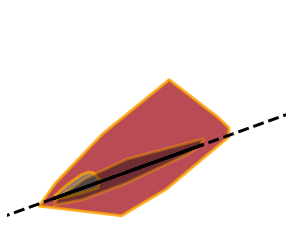

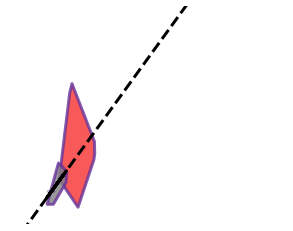

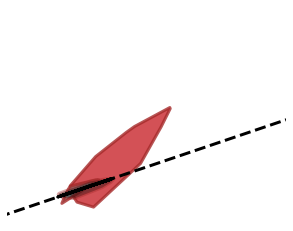

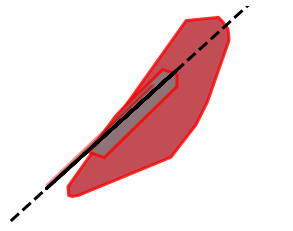

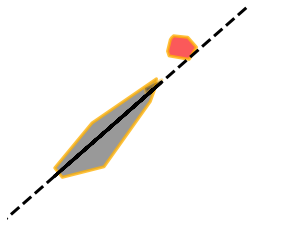

...

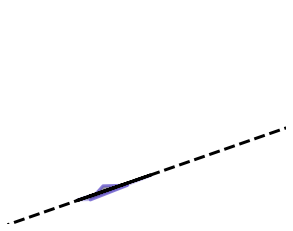

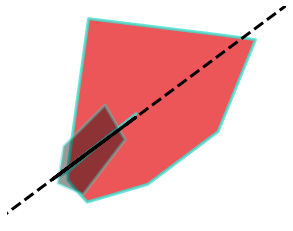

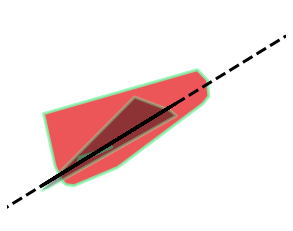

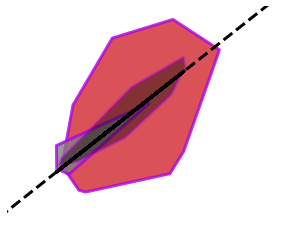

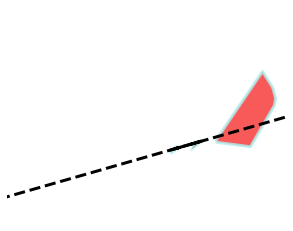

In [37]:
#RMSE is what measures the distance of the sample to the regression
sample_distance_to_fit['sample_RMSE_to_regression'] = np.nan
#joint regression reffers to the regression calculated using effusive material and bulk pyroclastic material together
fit_info['polinomial fit coeff a/joint regression'] = np.nan
fit_info['polinomial fit coeff b/joint regression'] = np.nan
fit_info['number of samples for joint regression'] = np.nan

for volcan in fit_info[fit_info['fit case'].isin(['Case 1', 'Case 2', 'Case 3', 'Case 6', 'Case 7', 'Case 8.1'])].Volcano :
    print(volcan)
    index = fit_info.index[fit_info.Volcano == volcan].tolist()[0]
    plt.figure(figsize=(5,4));
    ax = plt.axes()
    Color, Marker  = simbologia(volcan,'Unknown')
    plt.scatter(Data_glass[Data_glass.Volcano == volcan].SiO2,Data_glass[Data_glass.Volcano == volcan].K2O,color=Color,edgecolors =Color,s=130,alpha=0,label='Micro analytical pyroclastic')
    my_scale = spectra.scale([ "#FF3131", "#590d22" ]).domain([min(sampleNumbers), max(sampleNumbers)])
    my_range = my_scale(len(Data[Data.Volcano == volcan]))
    # ref: https://github.com/jsvine/spectra#creating-color-scales
    
    #----------- 'glass' products 
    if len(Data_glass[Data_glass.Volcano == volcan].SiO2)>2:
        v_samples = Data_glass[Data_glass.Volcano == volcan]
        points = []
        x_dim = 'SiO2'
        y_dim = 'K2O'
        for i, row in v_samples.iterrows():
            if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
            vp = [row[x_dim], row[y_dim]]
            points.append(vp)
        points = np.array(points)

        if len(points) > 2:
            hull = ConvexHull(points)
            vertexs = []
            for simplex in hull.vertices:
                vertexs.append([points[simplex, 0], points[simplex, 1]])
            patches = []
            polygon = Polygon(vertexs, True)
            patches.append(polygon)
            patchColl = PatchCollection(patches, alpha=0.8, color = my_range.hexcode, edgecolor = Color, linewidth=3)
            ax.add_collection(patchColl)
            
    #----------- 'effusive' products 
    if len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)>2:
        v_samples = Data_effusive[Data_effusive.Volcano == volcan]
        points = []
        x_dim = 'SiO2'
        y_dim = 'K2O'
        for i, row in v_samples.iterrows():
            if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
            vp = [row[x_dim], row[y_dim]]
            points.append(vp)
        points = np.array(points)

        if len(points) > 2:
            hull = ConvexHull(points)
            vertexs = []
            for simplex in hull.vertices:
                vertexs.append([points[simplex, 0], points[simplex, 1]])
            patches = []
            polygon = Polygon(vertexs, True)
            patches.append(polygon)
            patchColl = PatchCollection(patches, alpha=0.8, color = 'gray', edgecolor = Color, linewidth=3)
            ax.add_collection(patchColl)
    #----------- 'bulk pyroclastic' products    
    if len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)>2:
        v_samples = Data_bulk[Data_bulk.Volcano == volcan]
        points = []
        x_dim = 'SiO2'
        y_dim = 'K2O'
        for i, row in v_samples.iterrows():
            if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
            vp = [row[x_dim], row[y_dim]]
            points.append(vp)
        points = np.array(points)

        if len(points) > 2:
            hull = ConvexHull(points)
            vertexs = []
            for simplex in hull.vertices:
                vertexs.append([points[simplex, 0], points[simplex, 1]])
            patches = []
            polygon = Polygon(vertexs, True)
            patches.append(polygon)
            patchColl = PatchCollection(patches, alpha=0.4, color = 'black', edgecolor = Color, linewidth=3)
            ax.add_collection(patchColl)

            
    #---------------- plot 'effusive' and 'bulk pyroclastic' data and joint regression
    Data_regression = Data[((Data.TypeOfRegister=='Pyroclastic material')&(Data.TypeOfAnalysis=='Bulk'))|(Data.TypeOfRegister=='Effusive material')]
    z, rmse, rank, singular_values, rcond = np.polyfit(Data_regression[Data_regression.Volcano == volcan].SiO2,Data_regression[Data_regression.Volcano == volcan].K2O,1,full=True)
    p = np.poly1d(z)
    r2 = r2_score(Data_regression[Data_regression.Volcano == volcan].K2O, p(Data_regression[Data_regression.Volcano == volcan].SiO2))
#     plt.scatter(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,color='black',edgecolors ='black',s=130,alpha=0.5,label='Effusive')
#     plt.scatter(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,color=Color,edgecolors ='black',s=130,alpha=0.5,label='Bulk pyroclastic')
    plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
    plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=3)
    
#     ax.text(82,4.2,"Effusive: y = {}x + {}".format(np.around(z[0],3),np.around(z[1],3)),rotation=0,color='black',fontsize=14)
#     ax.text(82,3.7,"$r^{2}$ = "+str(np.around(r2,3)),rotation=0,color='black',fontsize=14)
#     ax.text(82,3.2,"RMSE = "+str(np.around(rmse[0],3)),rotation=0,color='black',fontsize=14)    
    fit_info.loc[index,'polinomial fit coeff a/joint regression'] = np.around(z[1],3)
    fit_info.loc[index,'polinomial fit coeff b/joint regression'] = np.around(z[0],3)
    fit_info.loc[index,'number of samples for joint regression'] = len(Data_regression[Data_regression.Volcano == volcan].SiO2)

#     leg=plt.legend(fancybox=True,ncol=1,loc='upper left',fontsize=12) # lengend = "micro analytical pyroclastic"
    ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
    plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
    ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
    plt.xlim(45,80);plt.ylim(0,4.5)
#     plt.title(volcan, fontsize = 20)    
    plt.axis('off')
    plt.savefig('../Plots/'+volcan+'.png',dpi = 300,bbox_inches='tight', transparent='True')
    
    temp = Data_glass[(Data_glass.Volcano==volcan)]
        
    for sample in temp.SampleID.unique():
        #print(sample)
#         plt.figure(figsize=(5,4));ax = plt.axes()
        temp2 = temp[temp.SampleID==sample]
#         plt.scatter(temp2.SiO2,temp2.K2O,color=Color,edgecolors =Color,s=130,alpha=0.3,label=sample)
#         plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
#         plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=3)

        # calculate distance (RMSE) of 'Sample' to the regression
        rmse = np.sqrt(mean_squared_error(temp2.K2O, p(temp2.SiO2)))
#         ax.text(82,3.2,"RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14)    
        index =  sample_distance_to_fit.index[sample_distance_to_fit.SampleID == sample].tolist()[0]   
        
        # save distance (RMSE) of 'Sample'
        sample_distance_to_fit.loc[index,'sample_RMSE_to_regression'] = rmse  
        sample_distance_to_fit.loc[index,'Volcano'] = volcan
        
#         leg=plt.legend(fancybox=True,ncol=1,loc='lower right',fontsize=14)
#         ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
#         plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
#         ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
#         plt.xlim(45,80);plt.ylim(0,4.5)

           

### 4.- For case 4, 5, and 8.2 Mesure the distance of each 'micro analytical pyroclastic' sample to the respective 'effusive' or 'bulk pyroclastic' regression.

Sollipulli
Mocho-Choshuenco
Antillanca-Casablanca
Osorno
Apagado
Hornopirén
Chaitén
Corcovado
Mentolat
Cay
Macá
Lautaro
Aguilera
Monte Burney


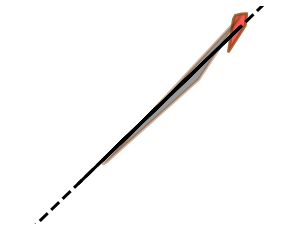

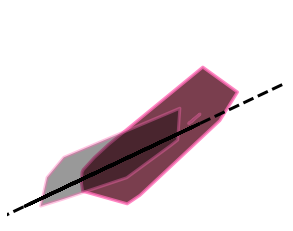

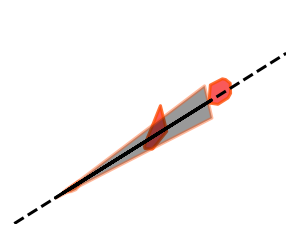

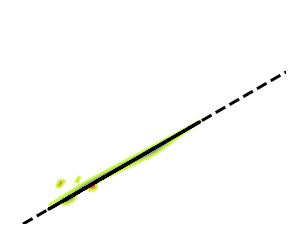

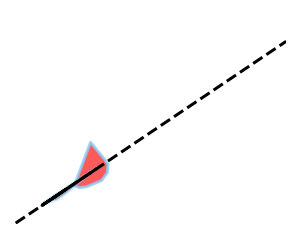

...

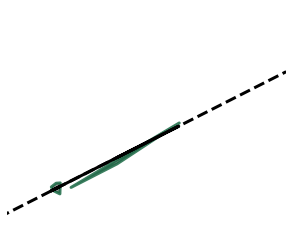

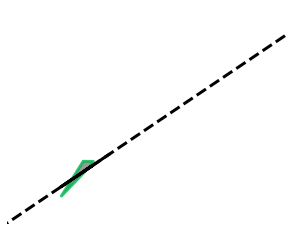

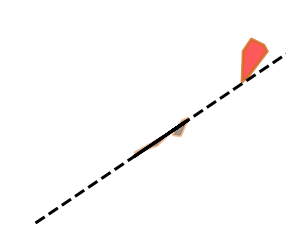

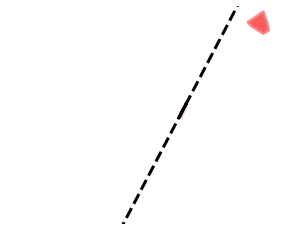

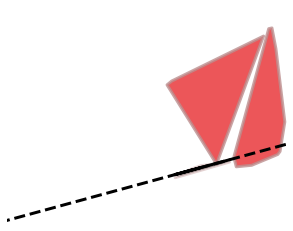

In [38]:
for volcan in fit_info[fit_info['fit case'].isin(['Case 4', 'Case 5', 'Case 8.2'])].Volcano :
    print(volcan)
    plt.figure(figsize=(5,4));ax = plt.axes()
    Color, Marker  = simbologia(volcan,'Unknown')
    plt.scatter(Data_glass[Data_glass.Volcano == volcan].SiO2,Data_glass[Data_glass.Volcano == volcan].K2O,color=Color,edgecolors =Color,s=130,alpha=0,label='Micro analytical pyroclastikc')
    my_scale = spectra.scale([ "#FF3131", "#590d22" ]).domain([min(sampleNumbers), max(sampleNumbers)])
    my_range = my_scale(len(Data[Data.Volcano == volcan]))
    
    #----------- 'glass' products 
    if len(Data_glass[Data_glass.Volcano == volcan].SiO2)>2:
        v_samples = Data_glass[Data_glass.Volcano == volcan]
        points = []
        x_dim = 'SiO2'
        y_dim = 'K2O'
        for i, row in v_samples.iterrows():
            if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
            vp = [row[x_dim], row[y_dim]]
            points.append(vp)
        points = np.array(points)

        clusters = sh.get_clusters_dbscan(points, eps=1, algorithm='auto')
        for c_label, c_points in clusters.items():
            if len(c_points) > 2:
                hull = ConvexHull(c_points)
    #                 for simplex in hull.simplices:
    #                     axes.plot(c_points[simplex, 0], c_points[simplex, 1], 'k-')
                vertexs = []
                for simplex in hull.vertices:
                    vertexs.append([c_points[simplex, 0], c_points[simplex, 1]])
                patches = []
                polygon = Polygon(vertexs, True)
                patches.append(polygon)
                patchColl = PatchCollection(patches, alpha=0.8, color = my_range.hexcode, edgecolor = Color, linewidth=3)
                ax.add_collection(patchColl)
    #----------- 'effusive' products 
    if len(Data_effusive[Data_effusive.Volcano == volcan].SiO2)>2:
        v_samples = Data_effusive[Data_effusive.Volcano == volcan]
        points = []
        x_dim = 'SiO2'
        y_dim = 'K2O'
        for i, row in v_samples.iterrows():
            if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
            vp = [row[x_dim], row[y_dim]]
            points.append(vp)
        points = np.array(points)

        clusters = sh.get_clusters_dbscan(points, eps=1, algorithm='auto')
        for c_label, c_points in clusters.items():
            if len(c_points) > 2:
                hull = ConvexHull(c_points)
    #                 for simplex in hull.simplices:
    #                     axes.plot(c_points[simplex, 0], c_points[simplex, 1], 'k-')
                vertexs = []
                for simplex in hull.vertices:
                    vertexs.append([c_points[simplex, 0], c_points[simplex, 1]])
                patches = []
                polygon = Polygon(vertexs, True)
                patches.append(polygon)
                patchColl = PatchCollection(patches, alpha=0.8, color = 'gray', edgecolor = Color, linewidth=3)
                ax.add_collection(patchColl)

    #----------- 'bulk pyroclastic' products    
    if len(Data_bulk[Data_bulk.Volcano == volcan].SiO2)>2:
        v_samples = Data_bulk[Data_bulk.Volcano == volcan]
        points = []
        x_dim = 'SiO2'
        y_dim = 'K2O'
        for i, row in v_samples.iterrows():
            if np.isnan(row[x_dim]) or np.isnan(row[y_dim]): continue
            vp = [row[x_dim], row[y_dim]]
            points.append(vp)
        points = np.array(points)

        clusters = sh.get_clusters_dbscan(points, eps=1, algorithm='auto')
        for c_label, c_points in clusters.items():
            if len(c_points) > 2:
                hull = ConvexHull(c_points)
    #                 for simplex in hull.simplices:
    #                     axes.plot(c_points[simplex, 0], c_points[simplex, 1], 'k-')
                vertexs = []
                for simplex in hull.vertices:
                    vertexs.append([c_points[simplex, 0], c_points[simplex, 1]])
                patches = []
                polygon = Polygon(vertexs, True)
                patches.append(polygon)
                patchColl = PatchCollection(patches, alpha=0.4, color = 'black', edgecolor = Color, linewidth=3)
                ax.add_collection(patchColl)

            
    #---------------- plot all 'effusive' or 'bulk pyroclastic' data and regression
    Data_regression = Data[((Data.TypeOfRegister=='Pyroclastic material')&(Data.TypeOfAnalysis=='Bulk'))|(Data.TypeOfRegister=='Effusive material')]
    z, rmse, rank, singular_values, rcond = np.polyfit(Data_regression[Data_regression.Volcano == volcan].SiO2,Data_regression[Data_regression.Volcano == volcan].K2O,1,full=True)
    p = np.poly1d(z)
    r2 = r2_score(Data_regression[Data_regression.Volcano == volcan].K2O, p(Data_regression[Data_regression.Volcano == volcan].SiO2))
#     plt.scatter(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,color='black',edgecolors ='black',s=130,alpha=0.5,label='Effusive')
#     plt.scatter(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,color=Color,edgecolors ='black',s=130,alpha=0.5,label='Bulk pyroclastic')
    plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
    plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=3)
    
#     ax.text(82,4.2,"Regression: y = {}x + {}".format(np.around(z[0],3),np.around(z[1],3)),rotation=0,color='black',fontsize=14)
#     ax.text(82,3.7,"$r^{2}$ = "+str(np.around(r2,3)),rotation=0,color='black',fontsize=14)
#     ax.text(82,3.2,"RMSE = "+str(np.around(rmse[0],3)),rotation=0,color='black',fontsize=14)    

#     leg=plt.legend(fancybox=True,ncol=1,loc='upper left',fontsize=12)
    ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
    plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
    ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
    plt.xlim(45,80);plt.ylim(0,4.5)
#     plt.title(volcan, fontsize = 20)
    plt.axis('off')
    plt.savefig('../Plots/'+volcan+'.png',dpi = 300,bbox_inches='tight', transparent='True')
    
    temp = Data_glass[(Data_glass.Volcano==volcan)]
        
    for sample in temp.SampleID.unique():
        #print(sample)
        temp2 = temp[temp.SampleID==sample]
        
        if len(temp2.SiO2)>2:
            #plot 'Sample'
#             plt.figure(figsize=(5,4));ax = plt.axes()
#             plt.scatter(temp2.SiO2,temp2.K2O,color=Color,edgecolors =Color,s=130,alpha=0.3,label=sample)
#             plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
#             plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=3)

            # calculate distance (RMSE) of 'Sample' to the regression
            rmse = np.sqrt(mean_squared_error(temp2.K2O, p(temp2.SiO2)))
#             ax.text(82,3.2,"RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14)    
        
            # save distance (RMSE) of 'Sample'
            index =  sample_distance_to_fit.index[sample_distance_to_fit.SampleID == sample].tolist()[0] 
            sample_distance_to_fit.loc[index,'sample_RMSE_to_regression'] = rmse  
            sample_distance_to_fit.loc[index,'Volcano'] = volcan
        
#             leg=plt.legend(fancybox=True,ncol=1,loc='lower right',fontsize=14)
#             ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
#             plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
#             ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
#             plt.xlim(45,80);plt.ylim(0,4.5)
        

In [ ]:
sample_distance_to_fit.to_excel("../Data/sample_distance_to_fit.xlsx")

In [ ]:
#-------------------- Load data
sample_distance_to_fit = pd.read_excel("../Data/sample_distance_to_fit.xlsx")

In [ ]:
sample_distance_to_fit = sample_distance_to_fit.dropna(subset=['Volcano'])
fig = px.scatter(sample_distance_to_fit, sample_distance_to_fit.Volcano, sample_distance_to_fit.sample_RMSE_to_regression,
                 color = 'Volcano', hover_data = ['SampleID','sample_RMSE_to_regression'],width=800, height=500)
fig.show()

### 5.- For all 'Samples' measure the distance to the regression of each 'SampleObservation'

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To con

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To con

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/weixiang/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To co

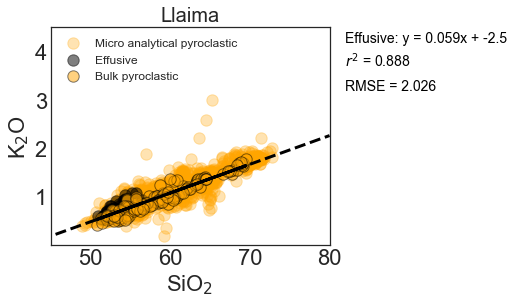

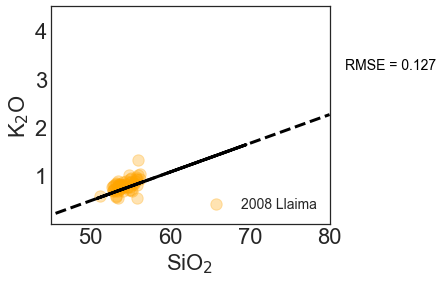

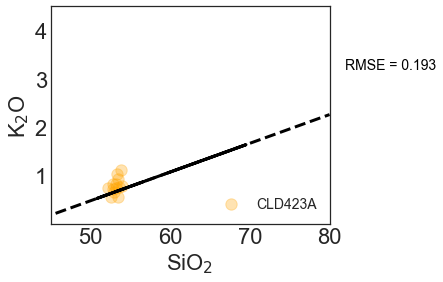

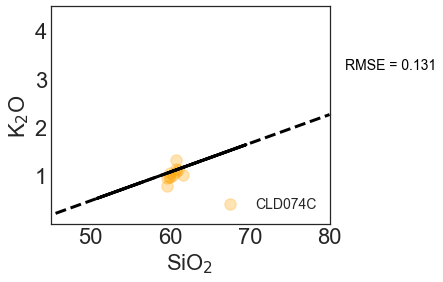

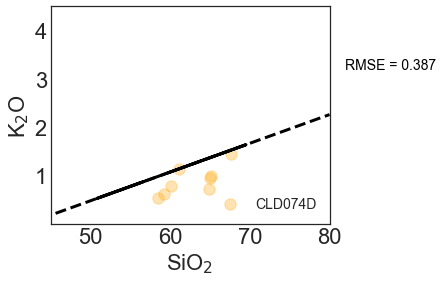

...

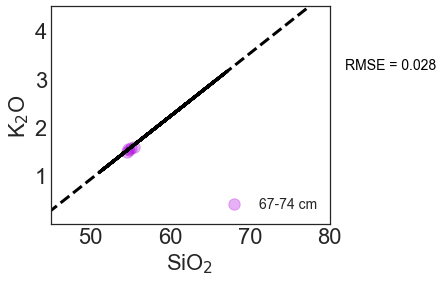

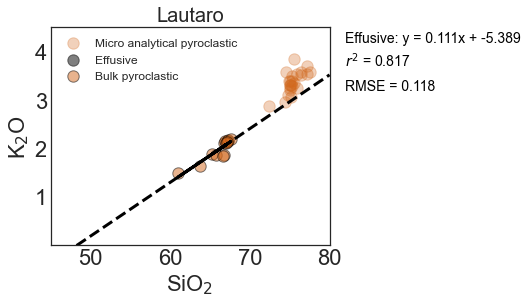

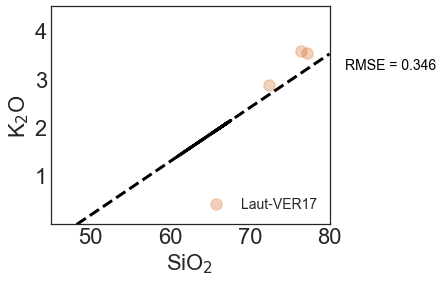

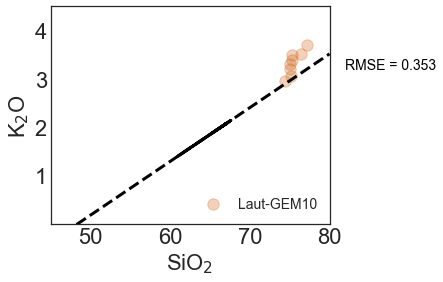

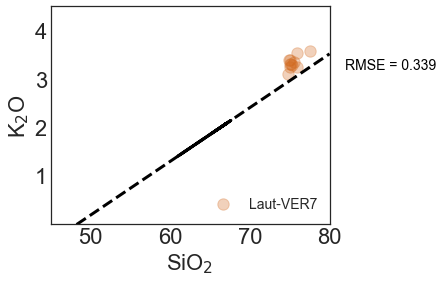

In [32]:
sampleObs_distance_to_fit = pd.DataFrame()
sampleObs_distance_to_fit['Volcano'] = np.nan
sampleObs_distance_to_fit['SampleObservationID'] = Data_glass.SampleObservationID.unique() 
sampleObs_distance_to_fit['SampleObservation_distance_to_regression'] = np.nan

for volcan in fit_info[fit_info['fit case'] != 'Case 0'].Volcano :
    #print(volcan)
    plt.figure(figsize=(5,4));ax = plt.axes()
    Color, Marker  = simbologia(volcan,'Unknown')
    plt.scatter(Data_glass[Data_glass.Volcano == volcan].SiO2,Data_glass[Data_glass.Volcano == volcan].K2O,color=Color,edgecolors =Color,s=130,alpha=0.3,label='Micro analytical pyroclastic')
    
    #---------------- plot all 'effusive' or 'bulk pyroclastic' data and regression
    z, rmse, rank, singular_values, rcond = np.polyfit(Data_regression[Data_regression.Volcano == volcan].SiO2,Data_regression[Data_regression.Volcano == volcan].K2O,1,full=True)
    p = np.poly1d(z)
    r2 = r2_score(Data_regression[Data_regression.Volcano == volcan].K2O, p(Data_regression[Data_regression.Volcano == volcan].SiO2))
    plt.scatter(Data_effusive[Data_effusive.Volcano == volcan].SiO2,Data_effusive[Data_effusive.Volcano == volcan].K2O,color='black',edgecolors ='black',s=130,alpha=0.5,label='Effusive')
    plt.scatter(Data_bulk[Data_bulk.Volcano == volcan].SiO2,Data_bulk[Data_bulk.Volcano == volcan].K2O,color=Color,edgecolors ='black',s=130,alpha=0.5,label='Bulk pyroclastic')
    plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
    plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=3)
    
    ax.text(82,4.2,"Effusive: y = {}x + {}".format(np.around(z[0],3),np.around(z[1],3)),rotation=0,color='black',fontsize=14)
    ax.text(82,3.7,"$r^{2}$ = "+str(np.around(r2,3)),rotation=0,color='black',fontsize=14)
    ax.text(82,3.2,"RMSE = "+str(np.around(rmse[0],3)),rotation=0,color='black',fontsize=14)    

    leg=plt.legend(fancybox=True,ncol=1,loc='upper left',fontsize=12)
    ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
    plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
    ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
    plt.xlim(45,80);plt.ylim(0,4.5)
    plt.title(volcan, fontsize = 20)
    temp = Data_glass[(Data_glass.Volcano==volcan)]
        
    for sample in temp.SampleID.unique():
        temp2 = temp[temp.SampleID==sample]
        if len(temp2.SiO2)>2:
            #print('.' + sample)
        #print(sample_distance_to_fit[sample_distance_to_fit.SampleID == sample])
         #filter samples with RMSE higher than 0.35 (arbitrary threshold, could change in the future, mainly to higher values)
            #Plot the 'Sample'
            plt.figure(figsize=(5,4));ax = plt.axes()
            plt.scatter(temp2.SiO2,temp2.K2O,color=Color,edgecolors =Color,s=130,alpha=0.3,label=sample)
            plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
            plt.plot(np.array([40,80]),p(np.array([40,80])),color='black',linestyle='--',linewidth=3)
            rmse = np.sqrt(mean_squared_error(temp2.K2O, p(temp2.SiO2)))
            ax.text(82,3.2,"RMSE = "+str(np.around(rmse,3)),rotation=0,color='black',fontsize=14) 
        
            leg=plt.legend(fancybox=True,ncol=1,loc='lower right',fontsize=14)
            ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
            plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
            ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
            plt.xlim(45,80);plt.ylim(0,4.5)
                
            for sampleObs in temp2.SampleObservationID.unique().tolist():
                #print('..'+ sampleObs)
                temp3 = temp2[temp2.SampleObservationID==sampleObs]
                a = -z[0]; c = -z[1]; b = 1
                shortestDistance = np.linalg.norm(a*temp3.SiO2+b*temp3.K2O+c)/np.sqrt(a*a+b*b)
                index =  sampleObs_distance_to_fit.index[sampleObs_distance_to_fit.SampleObservationID == sampleObs].tolist()[0]
                
                # save distance of 'SampleObservation' to the regression
                #    if curve is ax + bx + c = 0, then distance of a point to the curve is |aX0 + bx0 + c| / sqrt(a^2 + b^2)) 
                sampleObs_distance_to_fit.loc[index,'SampleObservation_distance_to_regression'] = shortestDistance
                sampleObs_distance_to_fit.loc[index,'Volcano'] = volcan
                
                #Plot the 'SampleObservation'
                #plt.figure(figsize=(5,4));ax = plt.axes()
                #plt.scatter(temp3.SiO2,temp3.K2O,color=Color,edgecolors =Color,s=130,alpha=0.3,label=sampleObs)
                #plt.plot(Data_regression[Data_regression.Volcano == volcan].SiO2,p(Data_regression[Data_regression.Volcano == volcan].SiO2),color='black',linewidth=3)
                #ax.text(82,3.2,"Distancia = "+str(np.around(shortestDistance,3)),rotation=0,color='black',fontsize=14) 
                
                #leg=plt.legend(fancybox=True,ncol=1,loc='lower right',fontsize=14)
                #ax.set_xticks([50,60,70,80]);ax.set_yticks([1,2,3,4])    
                #plt.xlabel(r"SiO$_{\rm 2}$", fontsize = 22);plt.ylabel(r"K$_{\rm 2}$O", fontsize = 22)
                #ax.tick_params(labelsize = 22,direction='in',axis='both')#,visible = True
                #plt.xlim(45,80);plt.ylim(0,4.5)

In [ ]:
sampleObs_distance_to_fit.to_excel("../Data/sampleObs_distance_to_fit.xlsx")

In [ ]:
#-------------------- Load data
sampleObs_distance_to_fit = pd.read_excel("../Data/sampleObs_distance_to_fit.xlsx")

In [ ]:
sampleObs_distance_to_fit = sampleObs_distance_to_fit.dropna(subset=['Volcano'])
fig = px.scatter(sampleObs_distance_to_fit, sampleObs_distance_to_fit.Volcano, sampleObs_distance_to_fit.SampleObservation_distance_to_regression,
                 color = 'Volcano', hover_data = ['SampleObservationID','SampleObservation_distance_to_regression'],width=800, height=500)
fig.show()